# Moderniazation, Regime and Democratic Decline
*Simon Polichinel von der Maase*

*The department of Political Science - University of Copenhagen*

----
# Description of the data, and the analysis problem

The problem at hand is that of **predicting democratic decline in nationstates**. Or more precisely it is a study regarding whether specific variables concerning "modernization" and current regime are useful in this endeavor.

The purpose is to gain an understanding regarding the effect of modernization and current regime on the probability of democratic decline. This understanding is crucial for the constructing of more elaborate models which could help policy-makers make informed decisions regarding foreign-aid, crisis management and interventions. I utilize data from the Polity IV project, The Maddison project and data from the Gapminder database. Specifically the target (y) is a binary indicator of whether or not a given country will decline 1 or more points on the Polity 2 scale the following year(t+1). 

- $y$: Any decline in polity2 score in country c, at year t+1. Binary where $y \in \{0,1\}$

The features are:

- $x_1$: log(GDP per capita (ppp)) in country c, at year t. Continues interval/ratio where $x_2 \in R_{\geq0}$
- $x_2$: log(infant mortality per 1000 live briths) in country c, at year t.  Continues ratio where $\{x_3 \in R | x_3 \geq 0, x_3 \leq log(1000)\}$
- $x_3$: Democ score in country c, at year t. Discrete interval where $x_3 \in \{0,1\ldots10\}N$
- $x_4$: Autoc score in country c, at year t. Discret interval where $x_4 \in \{0,1\ldots10\}N$

Two more are constructed as interactions:
- $x_5$: $x_1 * x_2$  
- $x_6$: $x_3 * x_4$

Traditionally researchers include country and year specific fixed effects. I have instead chosen to construct the model as a hierarchical model taking into account the following (traditional) grouping-features:

- $z_1$: The Country c. Discrete Nominal where each country is given an index value $\in \{1,2 \ldots 154\}N$  

- $z_2$ The year t.  Discrete interval where $z_2 \in \{1800,1801\ldots2010\}N$

in the following subsections I will briefly ellaborate on first the features and then the target. More importantly perhaps, these subsections will also serve to present the theoretical and methodological framework encompassing the problem - if only very superficially. 

## Modernization: $x_1$ and $x_2$

The measurements $x_1$ and $x_2$ is a link to the literature of modernization theory. Here it states that more well-to-do countries rarely, if ever, experience democratic recession (Libst 1959, Przeworski & Limongi 1997, Boix 2011). In the litterature both $x_1$ and $x_2$ are regarded as somewhat reliable measurements of some latent feature "development" or "modernization" (Goldstne 2001, PITF 2010). The relationship between "modernizations" and the features have traditionally been explored using classic econometrics and significance-testing (See PITF 2010 for a expection). This research has repeatedly augmented the case for a relationship between democracy and modernization (See Robinson 2006 for an exception). 

## The Current regime: $x_3$ and $x_4$

It has been argued that the probability of a democratic decline is tied to the nature of the current regime. Very democratic regimes rarely experience democratic decline, neither does very autocratic regimes - the latter not least due to the fact that some of them can't decline any futher. This relationship is often modelled as $polity2^2$. However the polity2 score is just an aggregate of the scores Democ and Autoc: 

$$ Democ - Autoc = polity2 \text{ where } x \in \{-10,-9 \ldots 9, 10\}$$

Where Democ represent the quality of democratic institutions and Autuc represent repression (roughly speaking). The researchers behind the polity IV components do, however, caution this aggregation since the measurements might not be on a comparable scale in all settings (Marshall et al. 2016). Thus, to avoid the quadratic transformation and heed the warnings laid forth I simply choose to incorporate the features as two different components here.

## Democratic decline: $y$
Conveniently I now turn to the target, which does in fact use the aggregation I just warned about. The justification for this is the fact that I transform the polity2 score into a binary that only indicates decline(1) and not-decline(0). Thus whether the "space" between the values in Democ and Autoc in comparable is of no concern. This transformation is of course - and regrettable - a huge squandering of the information in the data. There a a lot to learn from both the number of points a country decline, and to see whether modernization and current regime have the same link to both the Autoc and Democ score. I shall return to these subjects in the concluding discussion and future studies.

As noted above, I am leading the target one year ahead of the features. This is vital if a model such as this is to be used for policy purposes.

## The heirarchical structure: $z_1$ and $z_2$
Conventional year and country specific fixed effects are incorporated into the model either as Dummies or indirectly via Demeaning. In a Bayesian multilevel framework this can more elegantly be incorporated through a hierarchy. Furthermore this gives me the opportunity to construct a more realistic representation of the data generating process - this will be elaborated on in the next section.

---
# Description of the model(s)

AS the target is a binary variable I utilize a logistic regression. To incorporate the hierarchical structure of the model I utilize $z_1$ and $z_2$. In my preliminary research I implemented various models with both shared, separate(here analog to fixed effects) and varying(hierarchical) intercepts. But as the models with varying intercepts better represent the realty of the data generating process and persistently outperformed (at least by some margin) the other models I will stick exclusively to this framework in the assignment at hand. This is also done to keep the assignment concise and on topic.

To asses the relevance for the different features I implement 10 different models.

1. A base-model only containing the hierarchical structure provided by $z_1$ and $z_2$
2. The hierarchy of $z_1$ and $z_2$, along with $X \in \{x_1\}$
3. The hierarchy of $z_1$ and $z_2$, along with $X \in \{x_2\}$
4. The hierarchy of $z_1$ and $z_2$, along with $X \in \{x_1, x_2\}$
5. The hierarchyof $z_1$ and $z_2$, along with $X \in \{x_1, x_2, x_5\}$
6. The hierarchy of $z_1$ and $z_2$, along with $X \in \{x_1, x_2, x_3, x_4, x_5\}$
7. The hierarchy of $z_1$ and $z_2$, along with $X \in \{x_3, x_4\}$
8. The hierarchy of $z_1$ and $z_2$, along with $X \in \{x_3, x_4, _6\}$
9. The hierarchy of $z_1$ and $z_2$, along with $X \in \{x_1, x_2, x_3, x_4, x_5, x_6\}$
10. The hierarchy of $z_1$ and $z_2$, along with $X \in \{x_1, x_2, x_3, x_4, x_6\}$

This is by no means an exhaustive feature selection process, neither is it especially systematic from a technical perspective. From a substantial point of view, however, the steps do serve to asses the questions at hand. Hopefully, if this is not intuitively clear now, it will be as I asses the results in subsequent sections.

To spare the reader an excessive amount of mathematical notation I only present two general models. One for the base model and one general model for all models. This also mirrors the way it is in fact implemented in Stan. 

Before presenting the models mathematically **it should be noted that the grouping/partial pooling in the models has been implemented with non-centered parameterization for the hierarchical country and year priors** - and not with the more conventional centered parameterization. Algebraic this does no difference - it is basically just refactoring the prior. However, under some circumstances it does help greatly on the computation. The problem at hand was just such case. Including the common $\mu$ and $\sigma$ for the country and year specific intercepts as centered parameters (conventional) prevented the markov chain from converging. Implementing the non-centered parameterization sorted the problem right out. I will note here dive further into the subject but refer the reader to [this blog post](http://elevanth.org/blog/2017/09/07/metamorphosis-multilevel-model/) and [this case-study](http://mc-stan.org/users/documentation/case-studies/divergences_and_bias.html). For now it is enough to know that I have divided the components of the $\alpha$'a into a $\mu$, a $\sigma$ and a term $\alpha\_raw$ which is basically a standardized $\alpha$. Adding the $\mu$ and $\sigma$ back in, can be seen as an un-standardization. Thus no mathematical difference, but now my Markov chain works.

### The Base Model

$$Pr(y=1) = logit^{-1}(\alpha_{1[c]} + \alpha_{2[t]})$$

$$ \alpha_{1[c]} = \mu_{\alpha} + \sigma_{\alpha_1} * \alpha\_raw_{1[c]} $$
$$ \alpha_{2[y]} = \mu_{\alpha} + \sigma_{\alpha_2} * \alpha\_raw_{1[y]} $$

$$
\mu_{\alpha} \sim \text{Normal}(0,10)
$$

$$
\sigma_{\alpha_1} \sim \text{Normal}(0,10)
$$
$$
\alpha\_raw_{1} \sim \text{Normal}(0,10)
$$

$$
\sigma_{\alpha_2} \sim \text{Normal}(0,10)
$$
$$
\alpha\_raw_{2} \sim \text{Normal}(0,10)
$$

**The priors are chosen to be only weakly informative, but still slightly regularizing in case of extreme data points**. One could properly do better with more informative priors, but for now this will do.

### The Feature Including Model(s)
 
$$Pr(y=1) = logit^{-1}(X\beta + \alpha_{1[c]} + \alpha_{2[t]})$$

$$\beta \sim \text{Normal}(0,1)$$

$$ \alpha_{1[c]} = \mu_{\alpha} + \sigma_{\alpha_1} *  \alpha\_raw_{1[c]} $$
$$ \alpha_{2[y]} = \mu_{\alpha} + \sigma_{\alpha_2} *  \alpha\_raw_{1[y]} $$

$$
\mu_{\alpha} \sim \text{Normal}(0,10)
$$

$$
\sigma_{\alpha_1} \sim \text{Normal}(0,10)
$$
$$
\alpha\_raw_{1} \sim \text{Normal}(0,10)
$$

$$
\sigma_{\alpha_2} \sim \text{Normal}(0,10)
$$
$$
\alpha\_raw_{2} \sim \text{Normal}(0,10)
$$

Where $\beta$ is a vector of coefficients associated the the included features in Matrix X. Again the priors are chosen as to be only weakly informative, but still slightly regularizing in case of extreme data points, however** I have given $\beta$ a slightly more informative prior. This is due to scale of the X's and more importantly the y; log(odds). Moreover, experience has taught us not to expect large coefficients in these kind of problems(PITF 2010).**

Future developments of the models and prior selections will be discussed in the concluding discussion**

# Assessing the Model:

Here, there are two step; first I need to find the best model, then I need to evaluate this model. As such I implement two-level cross validation.

To make possible a final evaluation I start by splitting up the data into a test- and a training-set. **The training-set consists of all years NOT including the last three years. The test-set then consists of the final three years.**. Again, this is done to mirror and applicational setting where policy-makers would like to asses the risk of democratic decline before it actually happens. Of cause given the construction of y it would be most prudent to only predict one year ahead. However, there are simply to few declines per year to make this a viable test-set.

As such the model selection is based solely on the training-set, and the evaluation here consist of PSIS-loo. Afterwards I asses the chosen model using the hold-out test-set and I also asses the model via the posterior predictive distribution.

---

Below I do some intial datahandeling before compiling the two models, not least defining the nine different X matricies. and splitting the data into train- and test-set.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import pickle

from sklearn.metrics import roc_curve, roc_auc_score

import pystan

import psis
import stan_utility

In [2]:
df = pd.read_csv("BDA_eks.csv", index_col= 0)

In [3]:
# make subset1:

nul_df = df[df.pol_neg_change == 0]
mini_df = df[df.pol_neg_change > 0]
nulls = int(len(mini_df))

nul_sample = nul_df.sample(n = nulls, random_state=123)
small_df = pd.concat([nul_sample, mini_df])

#list_countries = df[df.pol_neg_change > 0].countryn.unique()
#smart_df = df[(df["countryn"].isin(list_countries)) & (df["year"] >= 2000)]

y = df.pol_neg_change
X =  df[["log_inf_mort", "log_gdp_cap", "interaction_gdp_inf_mort", "democ", "autoc", "countryn", "year"]]


# ----------------------------------------------------------------------------------------------

Xy = X.copy()
Xy["pol_neg_change"] = y
Xy.dropna(inplace = True)


Xy["country_indicator"] = pd.get_dummies(Xy.countryn).values.argmax(1)+1 # drop first for ref cat hmmm...
Xy["year_indicator_all"] = pd.get_dummies(Xy.year).values.argmax(1)+1 # drop first for ref cat.. Try with and without

# -----------------
# test last year
#Xy_test = Xy[Xy["year"] == max(Xy["year"])]
#Xy = Xy[Xy["year"] < max(Xy["year"])]

# test three last years
three_last_year = sorted(Xy.year.unique())[-3:]

Xy_test = Xy[Xy["year"].isin(three_last_year)]
Xy = Xy[np.logical_not(Xy["year"].isin(three_last_year))]

# -----------------

X = Xy.drop(["pol_neg_change","country_indicator","year_indicator_all","countryn", "year"], axis = 1)
y = Xy.pol_neg_change

dummy_y = []
for i in y:
    dummy_y.append(int(min(i,1)))

y = np.array(dummy_y)

country_indicator = Xy.country_indicator
year_indicator = Xy.year_indicator_all
#---------------------------------------------------------------------------------------
# test:

X_test = Xy_test.drop(["pol_neg_change","country_indicator","year_indicator_all","countryn", "year"], axis = 1)
y_test = Xy_test.pol_neg_change

dummy_y_test = []
for i in y_test:
    dummy_y_test.append(int(min(i,1)))

y_test = np.array(dummy_y_test)

country_indicator_test = Xy_test.country_indicator
year_indicator_test = Xy_test.year_indicator_all # men den her skal jeg vel netop ikke bruge...

N_obs_test = X_test.shape[0]


# --------------------------------------------------------------------------------------
N_countries = max(country_indicator) #len(country_indicator.unique()) # minu 1 fordi du skal havde en ref cat. det er også derfor du har drop_first = true nedenfor 
N_years = max(year_indicator)#len(year_indicator.unique())

N_obs = X.shape[0]
K_col = X.shape[1]

data_list = dict(X = X,
                 X_pred = X_test,
                 y = y,
                 N = N_obs,
                 N_pred = N_obs_test,
                 K = K_col,
                 J = N_countries,
                 C = country_indicator,
                 C_pred = country_indicator_test,
                 M = N_years,
                 T = year_indicator)

# Men du har ingen ref cat har du???

In [4]:
# GDP only
X2 = X[['log_gdp_cap']]
X2_test =  X_test[['log_gdp_cap']]
K_col2 = X2.shape[1]
#data_list2 = dict(X = X2, y = y, N = N_obs, K = K_col2, J = N_countries, C = country_indicator, M = N_years, T = year_indicator)

data_list2 = dict(X = X2,
                 X_pred = X2_test,
                 y = y,
                 N = N_obs,
                 N_pred = N_obs_test,
                 K = K_col2,
                 J = N_countries,
                 C = country_indicator,
                 C_pred = country_indicator_test,
                 M = N_years,
                 T = year_indicator)


# inf only
X3 = X[['log_inf_mort']]
X3_test = X_test[['log_inf_mort']]
K_col3 = X3.shape[1]
#data_list3 = dict(X = X3, y = y, N = N_obs, K = K_col3, J = N_countries, C = country_indicator, M = N_years, T = year_indicator)

data_list3 = dict(X = X3,
                 X_pred = X3_test,
                 y = y,
                 N = N_obs,
                 N_pred = N_obs_test,
                 K = K_col3,
                 J = N_countries,
                 C = country_indicator,
                 C_pred = country_indicator_test,
                 M = N_years,
                 T = year_indicator)


# inf and gdp
X4 = X[['log_inf_mort','log_gdp_cap']]
X4_test = X_test[['log_inf_mort','log_gdp_cap']]
K_col4 = X4.shape[1]
#data_list4 = dict(X = X4, y = y, N = N_obs, K = K_col4, J = N_countries, C = country_indicator, M = N_years, T = year_indicator)

data_list4 = dict(X = X4,
                 X_pred = X4_test,
                 y = y,
                 N = N_obs,
                 N_pred = N_obs_test,
                 K = K_col4,
                 J = N_countries,
                 C = country_indicator,
                 C_pred = country_indicator_test,
                 M = N_years,
                 T = year_indicator)



# GDP and inf
X5 = X[['log_inf_mort', 'log_gdp_cap', 'interaction_gdp_inf_mort']]
X5_test = X_test[['log_inf_mort', 'log_gdp_cap', 'interaction_gdp_inf_mort']]
K_col5 = X5.shape[1]
#data_list5 = dict(X = X5, y = y, N = N_obs, K = K_col5, J = N_countries, C = country_indicator, M = N_years, T = year_indicator)

data_list5 = dict(X = X5,
                 X_pred = X5_test,
                 y = y,
                 N = N_obs,
                 N_pred = N_obs_test,
                 K = K_col5,
                 J = N_countries,
                 C = country_indicator,
                 C_pred = country_indicator_test,
                 M = N_years,
                 T = year_indicator)


# 6 is just the full model with "data:_list"

# dem and auto
X7 = X[['democ','autoc']]
X7_test = X_test[['democ','autoc']]
K_col7 = X7.shape[1]
#data_list7 = dict(X = X7, y = y, N = N_obs, K = K_col7, J = N_countries, C = country_indicator, M = N_years, T = year_indicator)

data_list7 = dict(X = X7,
                 X_pred = X7_test,
                 y = y,
                 N = N_obs,
                 N_pred = N_obs_test,
                 K = K_col7,
                 J = N_countries,
                 C = country_indicator,
                 C_pred = country_indicator_test,
                 M = N_years,
                 T = year_indicator)



# dem, auto and int
X8 = X[['democ','autoc']]
X8_test = X_test[['democ','autoc']]
X8["interaction_democ_autoc"] = (X["democ"] + 1) * (X["autoc"] +1) # plus one, to negate zeores and retain information.
X8_test["interaction_democ_autoc"] = (X_test["democ"] + 1) * (X_test["autoc"] +1)  

K_col8 = X8.shape[1]
#data_list8 = dict(X = X8, y = y, N = N_obs, K = K_col8, J = N_countries, C = country_indicator, M = N_years, T = year_indicator)

data_list8 = dict(X = X8,
                 X_pred = X8_test,
                 y = y,
                 N = N_obs,
                 N_pred = N_obs_test,
                 K = K_col8,
                 J = N_countries,
                 C = country_indicator,
                 C_pred = country_indicator_test,
                 M = N_years,
                 T = year_indicator)



# ALL
X9 = X.copy()
X9["interaction_democ_autoc"] = (X["democ"] + 1) * (X["autoc"] +1) # plus one, to negate zeores and retain information.

X9_test = X_test.copy()
X9_test["interaction_democ_autoc"] = (X_test["democ"] + 1) * (X_test["autoc"] +1)

K_col9 = X9.shape[1]
#data_list9 = dict(X = X9, y = y, N = N_obs, K = K_col9, J = N_countries, C = country_indicator, M = N_years, T = year_indicator)
data_list9 = dict(X = X9,
                 X_pred = X9_test,
                 y = y,
                 N = N_obs,
                 N_pred = N_obs_test,
                 K = K_col9,
                 J = N_countries,
                 C = country_indicator,
                 C_pred = country_indicator_test,
                 M = N_years,
                 T = year_indicator)

# ALLmost all
X10 = X.copy()
X10.drop(['interaction_gdp_inf_mort'], axis = 1, inplace = True)
X10["interaction_democ_autoc"] = (X["democ"] + 1) * (X["autoc"] +1) # plus one, to negate zeores and retain information.

X10_test = X_test.copy()
X10_test.drop(['interaction_gdp_inf_mort'], axis = 1, inplace = True)
X10_test["interaction_democ_autoc"] = (X_test["democ"] + 1) * (X_test["autoc"] +1)

K_col10 = X10.shape[1]
#data_list9 = dict(X = X9, y = y, N = N_obs, K = K_col9, J = N_countries, C = country_indicator, M = N_years, T = year_indicator)
data_list10 = dict(X = X10,
                 X_pred = X10_test,
                 y = y,
                 N = N_obs,
                 N_pred = N_obs_test,
                 K = K_col10,
                 J = N_countries,
                 C = country_indicator,
                 C_pred = country_indicator_test,
                 M = N_years,
                 T = year_indicator)


/home/polichinel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:103: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/polichinel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


I now compile the tow different models:

In [5]:
%%time

compiled_model1 = stan_utility.compile_model('model1new.stan')
compiled_model2 = stan_utility.compile_model('model2new.stan')

Using cached StanModel
Using cached StanModel
CPU times: user 8 ms, sys: 68 ms, total: 76 ms
Wall time: 74.4 ms


---
# Stan code
 
Below the code from my Stan models are shown (which can be found a separate .stan script  (see output below). Most of the code corresponds directly to what was laid forth in the mathematical representation in earlier sections. It is, however, worthwhile to note that I construct a y_tild; for posterior predictive checking, a y_pred for out-of-sample prediction on the test-set, and the log_lik for the PSIS-loo estimate. Both y_tild and log_lik a thus straight forward, just the models predictions of the given training-set. y_pred is a bit more tricky. To predict the three last years I, of course, use all country-varying intercepts. But I have no year-varying intercepts for the last three years. Here, then, I use overall the year mean and variation. This is not the worst one can do, but it is certainly not the best we could do either. Perhaps it is more appropriate to only use the mean and variation from years closer to the years we want to predict - say the last 10 or 20 years. Cross validation could be used to find an optimal number of prior years to include, but a more elegant and efficient solution would be to use Gaussian processes. This is not implemented here but I do briefly discuss the future prospects in the concluding discussion.

---


In [6]:
print(compiled_model1.model_code)

// Model1 only the heirarchical structure
data {
    //int<lower=0> K; // number of features
    int<lower=0> N; // number of data points
    int<lower=0> N_pred; // number of datapoints to predict
    int<lower=0> J; // number of countries
    int<lower=0> M; // number of years

    int<lower=1,upper=J> C[N]; // Country indicator
    int<lower=1,upper=M> T[N]; // Year indicator
    int<lower=1,upper=J> C_pred[N_pred]; //Country indicator for obs to predict


    int y[N]; // dummy label
    //matrix[N, K] X; // features
}
parameters {

    vector[J] alpha_raw1; // Country individual intercept
    vector[M] alpha_raw2; // Year individual intercept

    real mu_alpha;

    real<lower=0> sigma_alpha1; // Hierarchical country deviation
    real<lower=0> sigma_alpha2; // Hierarchical year deviation

}
transformed parameters {
    vector[J] alpha1 = mu_alpha + sigma_alpha1 * alpha_raw1 ; // Country intercept; non-centered
    vector[M] alpha2 = mu_alpha + sigma_alpha2 * alpha_raw2 ; // Year

In [7]:
print(compiled_model2.model_code)

//Hierarchical - Now with covariants
data {
    int<lower=0> K; // number of features
    int<lower=0> N; // number of data points
    int<lower=0> N_pred; // number of datapoints to predict
    int<lower=0> J; // number of countries
    int<lower=0> M; // number of years

    int<lower=1,upper=J> C[N]; // Country indicator
    int<lower=1,upper=M> T[N]; // Year indicator
    int<lower=1,upper=J> C_pred[N_pred]; //Country indicator for obs to predict

    int y[N]; // dummy label
    matrix[N, K] X; // features
    matrix[N_pred, K] X_pred; // features for prediction
}
parameters {
    vector[K] beta; // coefficients for predictors

    vector[J] alpha_raw1; // Country individual intercept
    vector[M] alpha_raw2; // Year individual intercept

    real mu_alpha;

    real<lower=0> sigma_alpha1; // Hierarchical country deviation
    real<lower=0> sigma_alpha2; // Hierarchical year deviation

}
transformed parameters {
    vector[J] alpha1 = mu_alpha + sigma_alpha1 * alpha_raw1 ; // Cou

---
# How Stan model is run
From here there is not much to it. I run the ten models using the two pre-compiled models and estimate the corrosponding PSIS-loo estimates.

I run 4 chains for 1000 iterations (excluding warmup). 

---

### - WARNINGS - 
On most machines this takes hours to run. To circumvent this wating time I have saved the fitted models as pickles. Thus they can be readily imported without the hassel of waiting. The code to load the pickles can be found just below the code to run the model.

In [8]:
%%time
#RUN ALL MODELS -> +2 hours
#for the stan-pickle instruction see: http://discourse.mc-stan.org/t/save-fit-model-in-pystan/2220/3
# note that when this script is run it also generates the pickles for future use.

stan_model1 = compiled_model1.sampling(data=data_list, seed=123)
loo1, loos1, ks1 = psis.psisloo(stan_model1["log_lik"])
print("1 done")

with open("model1_fit.pkl", "wb") as f:
    pickle.dump({'model' : compiled_model1, 'fit' : stan_model1}, f, protocol=-1)
f.close()

#------------------------------------------------------------------
stan_model2 = compiled_model2.sampling(data=data_list2, seed=123)
loo2, loos2, ks2 = psis.psisloo(stan_model2["log_lik"])
print("2 done")

with open("model2_fit.pkl", "wb") as f:
    pickle.dump({'model' : compiled_model2, 'fit' : stan_model2}, f, protocol=-1)
f.close()

#------------------------------------------------------------------
stan_model3 = compiled_model2.sampling(data=data_list3, seed=123)
loo3, loos3, ks3 = psis.psisloo(stan_model3["log_lik"])
print("3 done")

with open("model3_fit.pkl", "wb") as f:
    pickle.dump({'model' : compiled_model2, 'fit' : stan_model3}, f, protocol=-1)
f.close()

#------------------------------------------------------------------
stan_model4 = compiled_model2.sampling(data=data_list4, seed=123)
loo4, loos4, ks4 = psis.psisloo(stan_model4["log_lik"])
print("4 done")

with open("model4_fit.pkl", "wb") as f:
    pickle.dump({'model' : compiled_model2, 'fit' : stan_model4}, f, protocol=-1)
f.close()

#------------------------------------------------------------------
stan_model5 = compiled_model2.sampling(data=data_list5, seed=123)
loo5, loos5, ks5 = psis.psisloo(stan_model5["log_lik"])
print("5 done")

with open("model5_fit.pkl", "wb") as f:
    pickle.dump({'model' : compiled_model2, 'fit' : stan_model5}, f, protocol=-1)
f.close()

#------------------------------------------------------------------
stan_model6 = compiled_model2.sampling(data=data_list, seed=123)
loo6, loos6, ks6 = psis.psisloo(stan_model6["log_lik"])
print("6 done")

with open("model6_fit.pkl", "wb") as f:
    pickle.dump({'model' : compiled_model2, 'fit' : stan_model6}, f, protocol=-1)
f.close()

#------------------------------------------------------------------
stan_model7 = compiled_model2.sampling(data=data_list7, seed=123)
loo7, loos7, ks7 = psis.psisloo(stan_model7["log_lik"])
print("7 done")

with open("model7_fit.pkl", "wb") as f:
    pickle.dump({'model' : compiled_model2, 'fit' : stan_model7}, f, protocol=-1)
f.close()

#------------------------------------------------------------------
stan_model8 = compiled_model2.sampling(data=data_list8, seed=123)
loo8, loos8, ks8 = psis.psisloo(stan_model8["log_lik"])
print("8 done")

with open("model8_fit.pkl", "wb") as f:
    pickle.dump({'model' : compiled_model2, 'fit' : stan_model8}, f, protocol=-1)
f.close()

#------------------------------------------------------------------
stan_model9 = compiled_model2.sampling(data=data_list9, seed=123)
loo9, loos9, ks9 = psis.psisloo(stan_model9["log_lik"])
print("9 done")

with open("model9_fit.pkl", "wb") as f:
    pickle.dump({'model' : compiled_model2, 'fit' : stan_model9}, f, protocol=-1)
f.close()

#------------------------------------------------------------------
stan_model10 = compiled_model2.sampling(data=data_list10, seed=123)
loo10, loos10, ks10 = psis.psisloo(stan_model10["log_lik"])
print("10 done")

with open("model10_fit.pkl", "wb") as f:
    pickle.dump({'model' : compiled_model2, 'fit' : stan_model10}, f, protocol=-1)
f.close()


/home/polichinel/anaconda3/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(np.asarray(v).dtype, float):


1 done


/home/polichinel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.
  # Remove the CWD from sys.path while we load stuff.


2 done


/home/polichinel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:19: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.


3 done


/home/polichinel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:28: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.


4 done


/home/polichinel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:37: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.


5 done


/home/polichinel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:46: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.


6 done


/home/polichinel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:55: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.


7 done


/home/polichinel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:64: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.


8 done


/home/polichinel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:73: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.


9 done


/home/polichinel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:82: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.


10 done


/home/polichinel/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:91: UserWarning: Pickling fit objects is an experimental feature!
The relevant StanModel instance must be pickled along with this fit object.
When unpickling the StanModel must be unpickled first.


CPU times: user 4min 4s, sys: 32.5 s, total: 4min 36s
Wall time: 2h 32min 37s


---

# Code to loead the pickles
Un-comment and run to load the pre-fitted models and save a couple of hours.
The reason the code below, also takes a couple of minutes to execute, is that I have not pickled the psis-loo outputs.

In [9]:
# # so if you do want to run all the models, un comment and run:
# # you could also have pickled the psis-loo outputs..

# with open("model1_fit.pkl", "rb") as f:
#     data_dict = pickle.load(f)

# f.close()

# stan_model1 = data_dict['fit']
# loo1, loos1, ks1 = psis.psisloo(stan_model1["log_lik"])

# # ----------------------------------------------


# with open("model2_fit.pkl", "rb") as f:
#     data_dict = pickle.load(f)
 
# f.close()

# stan_model2 = data_dict['fit']
# loo2, loos2, ks2 = psis.psisloo(stan_model2["log_lik"])

# # ----------------------------------------------


# with open("model3_fit.pkl", "rb") as f:
#     data_dict = pickle.load(f)
 
# f.close()

# stan_model3 = data_dict['fit']
# loo3, loos3, ks3 = psis.psisloo(stan_model3["log_lik"])

# # ----------------------------------------------


# with open("model4_fit.pkl", "rb") as f:
#     data_dict = pickle.load(f)

# f.close()

# stan_model4 = data_dict['fit']
# loo4, loos4, ks4 = psis.psisloo(stan_model4["log_lik"])

# # ----------------------------------------------


# with open("model5_fit.pkl", "rb") as f:
#     data_dict = pickle.load(f)

# f.close()

# stan_model5 = data_dict['fit']
# loo5, loos5, ks5 = psis.psisloo(stan_model5["log_lik"])

# # ----------------------------------------------


# with open("model6_fit.pkl", "rb") as f:
#     data_dict = pickle.load(f)

# f.close()

# stan_model6 = data_dict['fit']
# loo6, loos6, ks6 = psis.psisloo(stan_model6["log_lik"])

# # ----------------------------------------------


# with open("model7_fit.pkl", "rb") as f:
#     data_dict = pickle.load(f)

# f.close()

# stan_model7 = data_dict['fit']
# loo7, loos7, ks7 = psis.psisloo(stan_model7["log_lik"])

# # ----------------------------------------------


# with open("model8_fit.pkl", "rb") as f:
#     data_dict = pickle.load(f)

# f.close()

# stan_model8 = data_dict['fit']
# loo8, loos8, ks8 = psis.psisloo(stan_model8["log_lik"])

# # ----------------------------------------------


# with open("model9_fit.pkl", "rb") as f:
#     data_dict = pickle.load(f)

# f.close()

# stan_model9 = data_dict['fit']
# loo9, loos9, ks9 = psis.psisloo(stan_model9["log_lik"])

# # ----------------------------------------------



# with open("model10_fit.pkl", "rb") as f:
#     data_dict = pickle.load(f)

# f.close()

# stan_model10 = data_dict['fit']
# loo10, loos10, ks10 = psis.psisloo(stan_model10["log_lik"])

# # ----------------------------------------------

In [10]:
stan_models = [stan_model1,stan_model2,
               stan_model3,stan_model4,
               stan_model5,stan_model6,
               stan_model7,stan_model8,
               stan_model9,stan_model10]

----
# Convergence diagnostics (Rhat, divergences, neff)

Given that I have estimated varying intercepts for both year and country, and that I have estimated log_lik and y_tilde for each observation, the stan-summary gets quite long to say the least. Thus I have chosen to put in the appendix at the end of this notebook. I can, however, disclose that **all Rhat values were 1.0**. Most **N_eff was the full 4000, while a few went as low as 1000**. None below that however. Thus there are **no signs of non-convergens**. That being said, I might be able to get even better N_eff numbers if I where to standardize the X's.

I now **check the treedepth, the E-BFMI, and the divergences:**

---

In [11]:
model_number = 1
for model in stan_models:
    print("Model " + str(model_number) + " dianostics")
    stan_utility.check_treedepth(model)
    stan_utility.check_energy(model)
    stan_utility.check_div(model)
    model_number += 1
    print("\n")

Model 1 dianostics
0 of 4000 iterations saturated the maximum tree depth of 10 (0.0%)
0.0 of 4000 iterations ended with a divergence (0.0%)


Model 2 dianostics
0 of 4000 iterations saturated the maximum tree depth of 10 (0.0%)
0.0 of 4000 iterations ended with a divergence (0.0%)


Model 3 dianostics
0 of 4000 iterations saturated the maximum tree depth of 10 (0.0%)
0.0 of 4000 iterations ended with a divergence (0.0%)


Model 4 dianostics
0 of 4000 iterations saturated the maximum tree depth of 10 (0.0%)
0.0 of 4000 iterations ended with a divergence (0.0%)


Model 5 dianostics
0 of 4000 iterations saturated the maximum tree depth of 10 (0.0%)
0.0 of 4000 iterations ended with a divergence (0.0%)


Model 6 dianostics
0 of 4000 iterations saturated the maximum tree depth of 10 (0.0%)
0.0 of 4000 iterations ended with a divergence (0.0%)


Model 7 dianostics
0 of 4000 iterations saturated the maximum tree depth of 10 (0.0%)
0.0 of 4000 iterations ended with a divergence (0.0%)


Model 

---
Again I see no reason to worry. As mentioned **I will also do a posterior predictive check, but I will savor this untill I have selected the best model**.


---

# Model comparison

I now plot the k's to asses whether I can trust the comming PSIS-loo estimates:

---

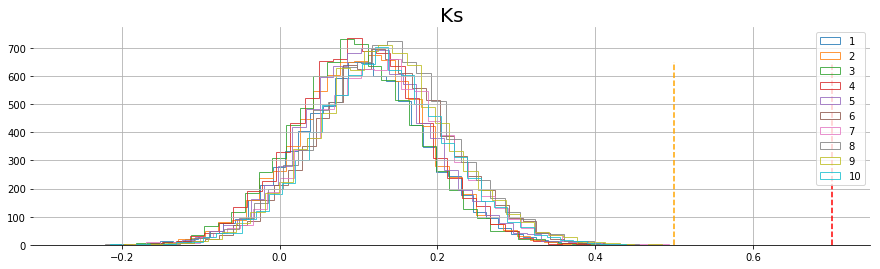

In [12]:

plt.figure(figsize=[15,4])
hist_coef = plt.hist(ks1, bins= 40, alpha = 0.8, label= "1", histtype='step')
plt.hist(ks2, bins= 40, alpha = 0.8, label= "2", histtype='step')
plt.hist(ks3, bins= 40, alpha = 0.8, label= "3", histtype='step')
plt.hist(ks4, bins= 40, alpha = 0.8, label= "4", histtype='step')
plt.hist(ks5, bins= 40, alpha = 0.8, label= "5", histtype='step')
plt.hist(ks6, bins= 40, alpha = 0.8, label= "6", histtype='step')
plt.hist(ks7, bins= 40, alpha = 0.8, label= "7", histtype='step')
plt.hist(ks8, bins= 40, alpha = 0.8, label= "8", histtype='step')
plt.hist(ks9, bins= 40, alpha = 0.8, label= "9", histtype='step')
plt.hist(ks10, bins= 40, alpha = 0.8, label= "10", histtype='step')


plt.vlines(0.5,0,max(hist_coef[0]), color = "orange", linestyles= "dashed")
plt.vlines(0.7,0,max(hist_coef[0]), color = "red", linestyles= "dashed")

plt.legend()
plt.title("Ks", fontsize=20)
plt.grid()
sns.despine(left = True)
plt.show()

___
For all models, **all k's are below 0.5 and as such far from 0.7**. Thus, here I find **no reason not to trust the following PSIS-loo estimates**:

___

In [13]:
#make a loop..
n=X.shape[0]

loo1_se = np.sqrt(np.var(loos1, ddof = 1)*n)
loo2_se = np.sqrt(np.var(loos2, ddof = 1)*n)
loo3_se = np.sqrt(np.var(loos3, ddof = 1)*n)
loo4_se = np.sqrt(np.var(loos4, ddof = 1)*n)
loo5_se = np.sqrt(np.var(loos5, ddof = 1)*n)
loo6_se = np.sqrt(np.var(loos6, ddof = 1)*n)
loo7_se = np.sqrt(np.var(loos7, ddof = 1)*n)
loo8_se = np.sqrt(np.var(loos8, ddof = 1)*n)
loo9_se = np.sqrt(np.var(loos9, ddof = 1)*n)
loo10_se = np.sqrt(np.var(loos10, ddof = 1)*n)



P_eff1 = np.sum(np.log(np.mean(np.exp(stan_model1.extract()['log_lik']), axis=0))) - loo1
P_eff2 = np.sum(np.log(np.mean(np.exp(stan_model2.extract()['log_lik']), axis=0))) - loo2
P_eff3 = np.sum(np.log(np.mean(np.exp(stan_model3.extract()['log_lik']), axis=0))) - loo3
P_eff4 = np.sum(np.log(np.mean(np.exp(stan_model4.extract()['log_lik']), axis=0))) - loo4
P_eff5 = np.sum(np.log(np.mean(np.exp(stan_model5.extract()['log_lik']), axis=0))) - loo5
P_eff6 = np.sum(np.log(np.mean(np.exp(stan_model6.extract()['log_lik']), axis=0))) - loo6
P_eff7 = np.sum(np.log(np.mean(np.exp(stan_model7.extract()['log_lik']), axis=0))) - loo7
P_eff8 = np.sum(np.log(np.mean(np.exp(stan_model8.extract()['log_lik']), axis=0))) - loo8
P_eff9 = np.sum(np.log(np.mean(np.exp(stan_model9.extract()['log_lik']), axis=0))) - loo9
P_eff10 = np.sum(np.log(np.mean(np.exp(stan_model10.extract()['log_lik']), axis=0))) - loo10


print("\n\n")
print("Model type \t\t PSIS_loo \tSE \tP_eff")
print("-"*50)

print("Model1: \t\t{0:.3f} \t{1:.2f}\t{2:.2f}".format(loo1,loo1_se,P_eff1))
print("Model2: \t\t{0:.3f} \t{1:.2f}\t{2:.2f}".format(loo2,loo2_se,P_eff2))
print("Model3: \t\t{0:.3f} \t{1:.2f}\t{2:.2f}".format(loo3,loo3_se,P_eff3))
print("Model4: \t\t{0:.3f} \t{1:.2f}\t{2:.2f}".format(loo4,loo4_se,P_eff4))
print("Model5: \t\t{0:.3f} \t{1:.2f}\t{2:.2f}".format(loo5,loo5_se,P_eff5))
print("Model6: \t\t{0:.3f} \t{1:.2f}\t{2:.2f}".format(loo6,loo6_se,P_eff6))
print("Model7: \t\t{0:.3f} \t{1:.2f}\t{2:.2f}".format(loo7,loo7_se,P_eff7))
print("Model8: \t\t{0:.3f} \t{1:.2f}\t{2:.2f}".format(loo8,loo8_se,P_eff8))
print("Model9: \t\t{0:.3f} \t{1:.2f}\t{2:.2f}".format(loo9,loo9_se,P_eff9))
print("Model10:\t\t{0:.3f}\t{1:.2f}\t{2:.2f}".format(loo10,loo10_se,P_eff10))


print("-"*50)

elpd_diff = loos10 - loos1
elpd_diff_se = np.sqrt(np.var(elpd_diff, ddof=1)*n)
elpd_diff = np.sum(elpd_diff)
print('elpd_diff between Model 1 and Model 10: {:.4} (SE {:.3})\n'.format(elpd_diff, elpd_diff_se))





Model type 		 PSIS_loo 	SE 	P_eff
--------------------------------------------------
Model1: 		-1023.592 	51.35	88.12
Model2: 		-1013.719 	50.80	76.07
Model3: 		-1014.105 	50.88	79.51
Model4: 		-1013.292 	50.83	76.95
Model5: 		-1013.642 	50.85	77.41
Model6: 		-960.820 	48.41	93.92
Model7: 		-972.877 	48.90	97.70
Model8: 		-963.999 	48.60	98.09
Model9: 		-955.480 	48.26	93.51
Model10:		-955.046	48.24	92.93
--------------------------------------------------
elpd_diff between Model 1 and Model 10: 68.55 (SE 11.3)



In [14]:
diff = str(round((loos1 < loos10).sum()/len(loos1)*100,2)) + "%"
print("The probability that model 10 is better the model 1: is " + diff)

The probability that model 10 is better the model 1: is 65.33%


In [15]:
diff = str(round((loos9 < loos10).sum()/len(loos9)*100,2)) + "%"
print("The probability that model 10 is better the model 9: is " + diff)

The probability that model 10 is better the model 9: is 50.91%


---
The performance differences between the models are not overwhelming. Perhaps it is a bit surprising that the base model - model 1, with only the hierarchical structure - does as well as it does compared to the models including the X's. As I will describe later on, however, this is not that strange given that the year- and country specific hierarchy is constructed to soak up as much variation as possible, thus preventing omitted variable bias.

**When comparing model 1 to model 2, 3, 4 and 5 we do see a drop in the PSIS-loo score when we introduce the various development variables. A more noticeable dip is seen from model 6 and onwards, which account for the current regime.**

Adding both regime and development variables - in model 9 and 10 - gives us the best result. Though again the difference is only minor and any conclusion should be treated with prudence. 
That being said, if we where to pick one model it should be model 10. As stated above there is a 65.33% probability that model 10 is better than model 1 and a 50.91% probability that it is better than model 9. This is not much to go on, but it is the best we have for now. As we shall below the evaluation of the different beta-coefficients trough the various models brings further leverage to this choice.

Below is a plot of the beta coefficients contained in each model: 

---

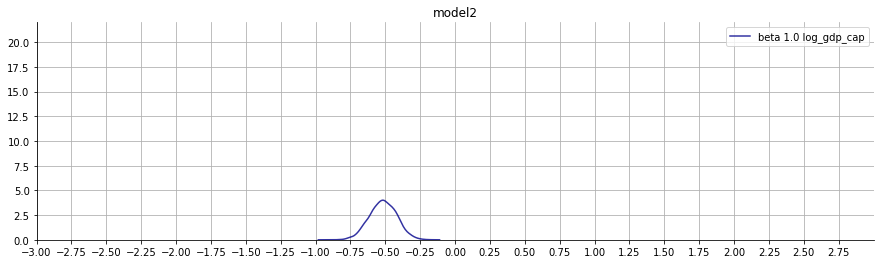

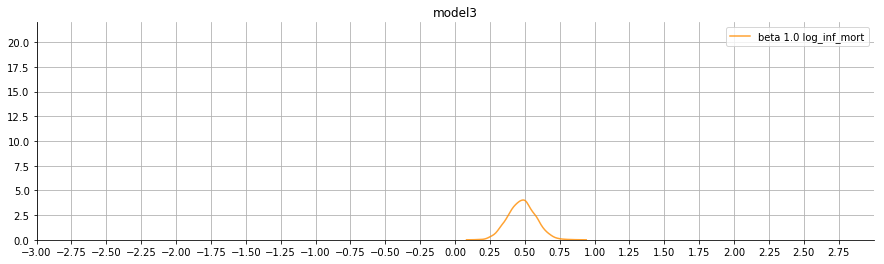

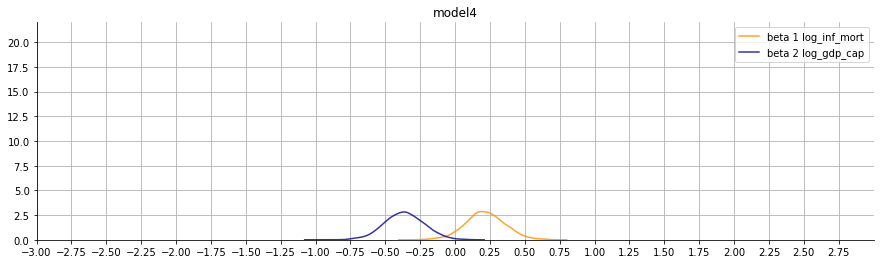

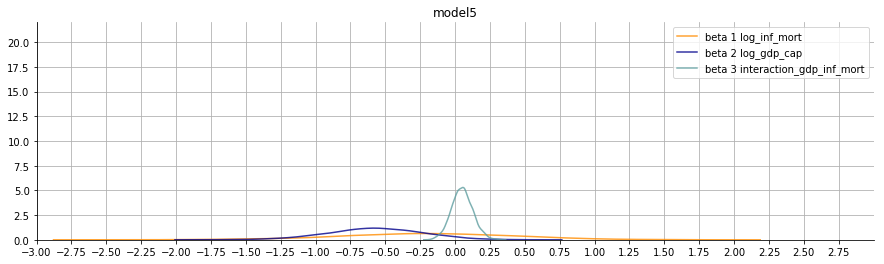

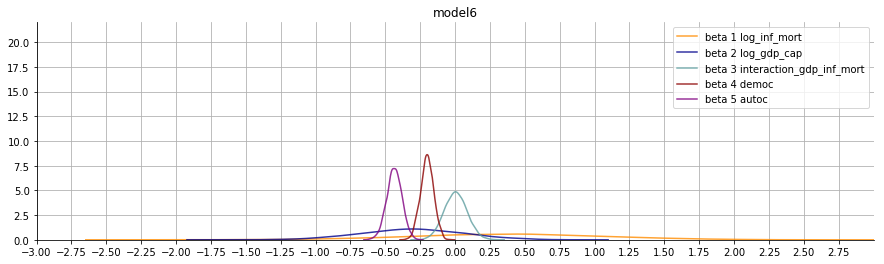

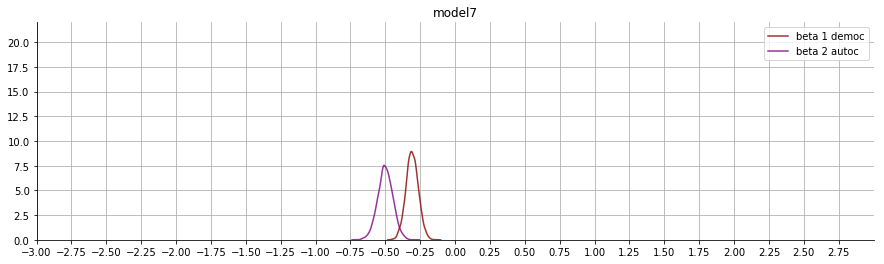

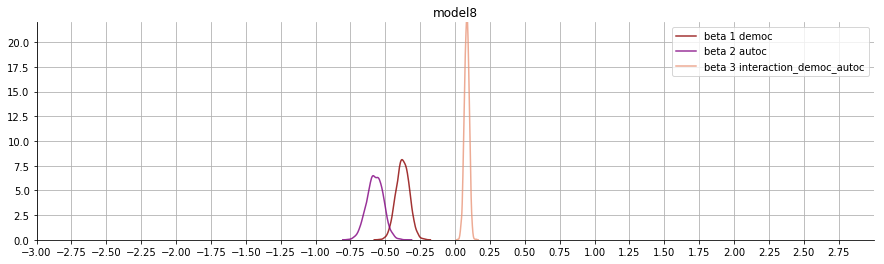

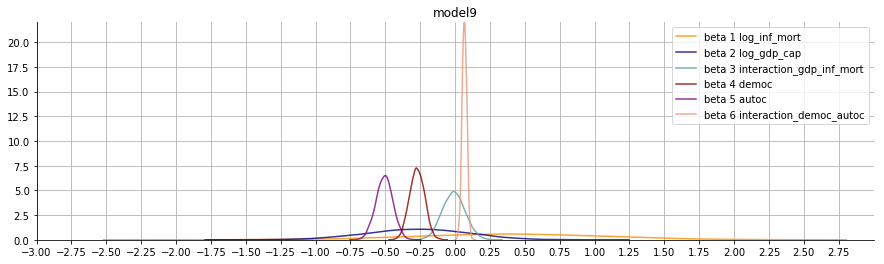

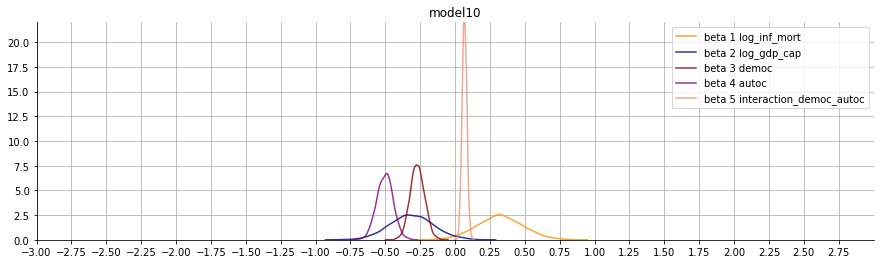

In [16]:
y_border = (0,22)
x_border = (-3,3)
x_ticks_range = np.arange(-3,3,0.25)

#2

colors2 = "darkblue"

plt.figure(figsize=[15,4])

beta_label =  "beta " + str(i+1) +" "+ str(X2.columns[0])
sns.kdeplot(stan_model2["beta"], label = beta_label, alpha = 0.8, color = colors2)

plt.xticks(x_ticks_range)
plt.ylim(y_border)
plt.xlim(x_border)   
plt.title("model2")        
sns.despine()
plt.grid()
plt.legend()
plt.show()

#3

colors3 = "darkorange"

plt.figure(figsize=[15,4])

plt.title("model3")    
beta_label =  "beta " + str(i+1) +" "+ str(X3.columns[0])
sns.kdeplot(stan_model3["beta"], label = beta_label, alpha = 0.8, color = colors3)

plt.xticks(x_ticks_range)
plt.ylim(y_border)
plt.xlim(x_border)  
sns.despine()
plt.grid()
plt.legend()
plt.show()


#4

colors4 = ["darkorange", "darkblue"]

plt.figure(figsize=[15,4])
for i in range(stan_model4["beta"].shape[1]):
    beta_label =  "beta " + str(i+1) +" "+ str(X4.columns[i])
    sns.kdeplot(stan_model4["beta"][:,i], label = beta_label, alpha = 0.8, color = colors4[i])

plt.xticks(x_ticks_range)
plt.ylim(y_border)
plt.xlim(x_border)   
plt.title("model4")    
sns.despine()
plt.grid()
plt.legend()
plt.show()

#5

colors5 = ["darkorange", "darkblue", "cadetblue"]

plt.figure(figsize=[15,4])
for i in range(stan_model5["beta"].shape[1]):
    beta_label =  "beta " + str(i+1) +" "+ str(X5.columns[i])
    sns.kdeplot(stan_model5["beta"][:,i], label = beta_label, alpha = 0.8, color = colors5[i])

plt.xticks(x_ticks_range)
plt.ylim(y_border)
plt.xlim(x_border)  
plt.title("model5")    
sns.despine()
plt.grid()
plt.legend()
plt.show()

#6

colors6 = ["darkorange", "darkblue", "cadetblue", "darkred", "purple"]


plt.figure(figsize=[15,4])
for i in range(stan_model6["beta"].shape[1]):
    beta_label =  "beta " + str(i+1) +" "+ str(X.columns[i])
    sns.kdeplot(stan_model6["beta"][:,i], label = beta_label, alpha = 0.8, color = colors6[i])

plt.xticks(x_ticks_range)
plt.ylim(y_border)
plt.xlim(x_border)   
plt.title("model6")    
sns.despine()
plt.grid()
plt.legend()
plt.show()

#7

colors7 = ["darkred", "purple"]

plt.figure(figsize=[15,4])
for i in range(stan_model7["beta"].shape[1]):
    beta_label =  "beta " + str(i+1) +" "+ str(X7.columns[i])
    sns.kdeplot(stan_model7["beta"][:,i], label = beta_label, alpha = 0.8, color = colors7[i])

plt.xticks(x_ticks_range)
plt.ylim(y_border)
plt.xlim(x_border)  
plt.title("model7")    
sns.despine()
plt.grid()
plt.legend()
plt.show()


#8

colors8 = ["darkred", "purple","darksalmon"]

plt.figure(figsize=[15,4])
for i in range(stan_model8["beta"].shape[1]):
    beta_label =  "beta " + str(i+1) +" "+ str(X8.columns[i])
    sns.kdeplot(stan_model8["beta"][:,i], label = beta_label, alpha = 0.8, color = colors8[i])


plt.xticks(x_ticks_range)
plt.ylim(y_border)
plt.xlim(x_border)   
plt.title("model8")    
sns.despine()
plt.grid()
plt.legend()
plt.show()

#9

colors9 = ["darkorange", "darkblue", "cadetblue", "darkred", "purple", "darksalmon"]

plt.figure(figsize=[15,4])
for i in range(stan_model9["beta"].shape[1]):
    beta_label =  "beta " + str(i+1) +" "+ str(X9.columns[i])
    sns.kdeplot(stan_model9["beta"][:,i], label = beta_label, alpha = 0.8, color = colors9[i])


plt.xticks(x_ticks_range)
plt.ylim(y_border)
plt.xlim(x_border)   
plt.title("model9")    
sns.despine()
plt.grid()
plt.legend()
plt.show()



#10

colors10 = ["darkorange", "darkblue", "darkred", "purple", "darksalmon"]

plt.figure(figsize=[15,4])
for i in range(stan_model10["beta"].shape[1]):
    beta_label =  "beta " + str(i+1) +" "+ str(X10.columns[i])
    sns.kdeplot(stan_model10["beta"][:,i], label = beta_label, alpha = 0.8, color = colors10[i])

plt.xticks(x_ticks_range)
plt.ylim(y_border)
plt.xlim(x_border)
plt.title("model10")    
sns.despine()
plt.grid()
plt.legend()
plt.show()

# print('Pr(beta > 0) = {}'.format(np.mean(samples['beta'] > 0)))

---
Looking at the beta output should help clarify why I have chosen model 10 over model 9. First of all, the point estimate of the interaction term between infant mortality and GDP per capita is practically zero, and the belonging probability distribution is not that wide. Second, the interaction term is highly corrolated with the two separate terms, which hints at its redundancy. Of course interaction-terms are always somewhat correlated with its separate parts, but as seen in the case of Democ and Autoc, it need not lead to zero point estimates, and overly wide distributions for the components. 

Thus, model 10 did not only perform best (if only marginal) in the PSIS-loo test, it also presents it self as the most appropriate model when we asses the estimated beta coefficients.

Going forward I proceed with model 10 as my main model; now called the full model. However, it shall be accompanied by model 1 wich serves as a base model; now called the restricted model.

Regarding the fact that the base-model did almost as well as the full model in the PSIS-loo estimates, there is a rather intuitively appealing explanation: The variation accounted for by the X's was already to some extent accounted for by the information in "country" and "year". This can easily be assessed be expecting the alpha values, specifically the common component mu_alpha:

---

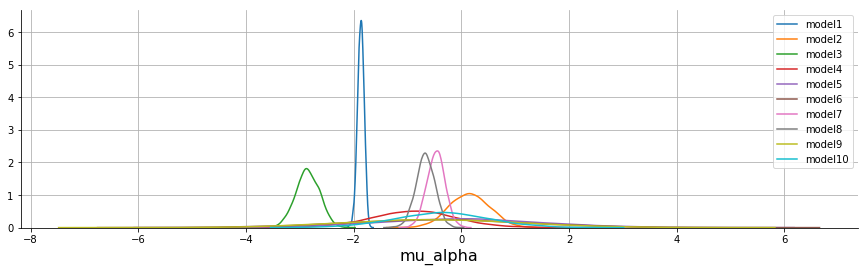

In [17]:
plt.figure(figsize=[15,4])
model_number = 1
for model in stan_models:
    sns.kdeplot(model["mu_alpha"], label = "model" + str(model_number))
    model_number += 1

plt.xlabel("mu_alpha", fontsize = 16)    
sns.despine()
plt.grid()
plt.legend()
plt.show()

---
The general pattern is that the more variables we introduce, the closer the point estimates of mu_alpha gets to zero and the larger the variation becomes. The pattern is that of strong correlation between the prior-intercepts and the features introduced - most notable log(GDP per capita). This feature is introduced in model 2, and appears again in 4, 5, 6, 9, 10. All these models - with the exception of model 4 - have a point estimate rather close to zero and all models - with the exception of model 2 - have a very high variation (note that 5, 6, 9 are rather hard to tell apart due to great overlap).

This is not a problem. One of the reasons to include the hierarchical structure in the model, is both to capture a lot of the variation, thus getting more efficient estimates, and to account for relevant features we might have overlooked, as such mitigating the problem of omitted variable bias. Point being, it is to be expected that we redistribute some "explanation-power" form the hierarchical structure to the features when these are introduced. 

We can take a closer look at the beta's from model 10:

---

In [18]:
beta_point = stan_model10["beta"].mean(axis = 0)

prob_dict = {}
for i in range(len(stan_model10["beta"].T)):
    key = "prob_beta" + str(i)
    prob_dict[key] = (sum(stan_model10["beta"][:,i] > 0)/len(stan_model10["beta"][:,i]),sum(stan_model10["beta"][:,i] < 0)/len(stan_model10["beta"][:,i]))
    

print("-"*70)
print("{0:24} {1:12} {2:12} {3:12}".format("Variable", "Point est.", "Pr(beta)>0", "Pr(beta)<0"))
print("-"*70)

for i in range(len(stan_model10["beta"].T)):
    get_key = "prob_beta" + str(i)
    print("{0:24} {1:6.3f} {2:12} {3:12}".format(X10.columns[i], beta_point[i], prob_dict[get_key][0], prob_dict[get_key][1]))
    
print("-"*70)
print("NOTE: 0.0 and 0.1 should be intepreated with prudence and \nthe understanding that the simulted sample is only n = 4000")
print("-"*70)


----------------------------------------------------------------------
Variable                 Point est.   Pr(beta)>0   Pr(beta)<0  
----------------------------------------------------------------------
log_inf_mort              0.322        0.976        0.024
log_gdp_cap              -0.311        0.028        0.972
democ                    -0.270          0.0          1.0
autoc                    -0.503          0.0          1.0
interaction_democ_autoc   0.068          1.0          0.0
----------------------------------------------------------------------
NOTE: 0.0 and 0.1 should be intepreated with prudence and 
the understanding that the simulted sample is only n = 4000
----------------------------------------------------------------------


---
(If of interest, the credibility intervals can be roughly assessed from the plots above or found in the output in the appendix)

Of course this numbers a given 4000 samples for each estimate and, thus the 0% probability should be interpreted tentatively as being below 0.0001%, and accordingly 100% as being above 99.9999%. In any case, we have two estimates  - infant mortality and the interaction between democ and autoc - which respectively have a 97.6% and 99.9% probability of being larger then 0. And we have three estimates - GDP per capita, Democ and Autoc - which respectively have a 97.2%, 99.9% and 99.9% probability of being smaller then 0.

Now, since I did not standardize the variables it does not make too much sense to compare the size of the coefficients (one could argue it still would not, even after a standardization). And given the continued interaction, the coefficients is also somewhat convoluted - though not impossible - to interpret. I shall therefore spare the reader this exercise and instead evaluate the model and its components on account of its predictions.

---
# Predictive performance assessment and posterior predictive checking

In this section I present two sets of evaluations.

**Firstly** on of the base model and the full model given y_tilde; the models own predictions of all observations and events in the training data. This is what we normally refer to as the posterior predictive distributions. This distribution is not readily comparable to the true y distribution. The reason is that the true y distribution is binary {0,1}N, whereas the posterior predictive distribution is a probability distribution (0,1)R. Thus a comparison would force us to choose some more or less arbitrary thresholds determining how high the probability of decline should be before we predict it as decline. I find it more appropriate to present the result as a ROC-curve. this also lessens the problem that the probability of rare events happening, is often underestimated by GLM estimators (King & Zeng 2010) (This can be amended with the right use of priors and other tools, wich I shall not dig into here.)

The reader should remember that we are still in-sample here and this ROC-curve should thus not be interpreted as a performance measure but a tool to asses posterior predictive distribution along a somewhat exhaustive list of threshholds.  

**Secondly** on of the base model and the full model given y_pred; the models own predictions of all observations and events in the training data. This is the actual predictive performance assessment. Though the goal is different I proceed just as above; a plot of what might be labelled a predictive-predictive posterior distribution, followed by a ROC-curve and a AUC-score which here should indeed be interpreted as a performances measure.

---

## y_tilde:

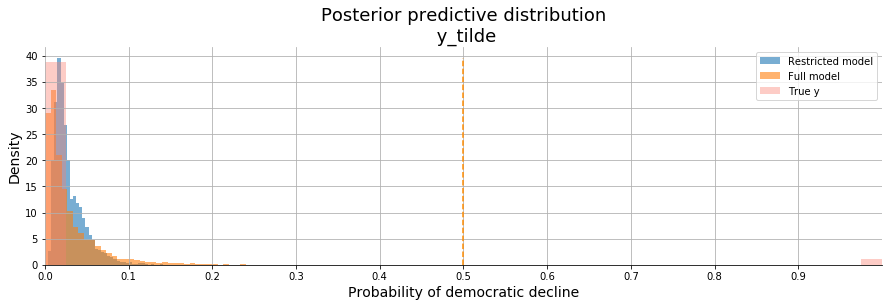

In [19]:
y_tilde_prob1 = stan_model1["y_tilde"].mean(axis = 0)
y_tilde_prob10 = stan_model10["y_tilde"].mean(axis = 0)


plt.figure(figsize=[15,4])

hist_nums1 = plt.hist(y_tilde_prob1, bins=40, alpha = 0.6, density= True, label = "Restricted model")
hist_nums9 = plt.hist(y_tilde_prob10, bins=40, alpha = 0.6, density= True, label = "Full model")

plt.hist(y, bins=40, alpha = 0.4, density= True, label = "True y", color = "salmon")


plt.vlines(0.5,0,max(hist_nums1[0]), colors= "darkorange", linestyles= "dashed")

plt.ylabel("Density", fontsize = 14)
plt.xlabel("Probability of democratic decline", fontsize = 14)
plt.title("Posterior predictive distribution\n y_tilde", fontsize=18)

plt.xlim(0,1)
plt.xticks(np.arange(0,1,0.1))

plt.legend()
plt.grid()
sns.despine(left = True)
plt.show()



---
Here we clearly see the problem of choosing a threshold. A easy - is misguided - choice whould be to set the threshold at 0.5, but as we see, no country had a probability of declining > 0.5. This partly due to the fact that the model is still rather simple and therefor there is still a lot of epistemological uncertainty, coupled with the fact that we are dealing with "rare events", the model is simply conservative in proclaiming an event. I find the distribution encouraging, and certainly it is interesting that the full model has more variance; particularly, it puts more observations in the 0.0 bin but also it has a longer tail stretching up above 0.2. Thus the full model seems to better distinguish between the different observations. The ROC-curv below accommodates this assessment. 

---

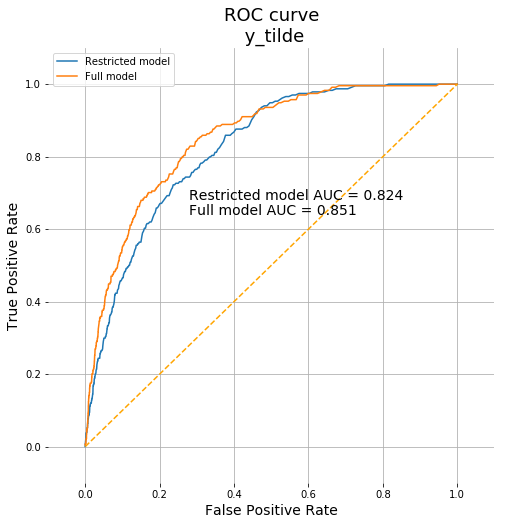

In [20]:
# This is in-sample
fpr1, tpr1, thresholds1 = roc_curve(y, y_tilde_prob1)
auc1 = round(roc_auc_score(y, y_tilde_prob1), 3)

fpr10, tpr10, thresholds10 = roc_curve(y, y_tilde_prob10)
auc10 = round(roc_auc_score(y, y_tilde_prob10), 3)

plt.figure(figsize=[8,8])

plt.plot(fpr1, tpr1, label = "Restricted model")
plt.plot(fpr10, tpr10, label = "Full model")

plt.plot(np.arange(0, 1.1, 0.1), np.arange(0, 1.1, 0.1), linestyle = "dashed", color = "orange")

plt.text(0.28,0.68,"Restricted model AUC = " + str(auc1), fontsize = 14)
plt.text(0.28,0.64,"Full model AUC = " + str(auc10), fontsize = 14)


plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.title('ROC curve\n y_tilde', fontsize = 18)
plt.xlabel('False Positive Rate', fontsize = 14)
plt.ylabel('True Positive Rate', fontsize = 14)
plt.grid(True)

plt.legend()
sns.despine(left=True, bottom= True)
plt.show()

---
Again this is not to be seen as a conventional performance measure per se - it is in-sample and the model 10 have already been chosen over the other models on account of this data.  It is merely to be seen as a supporting tool in assessing the posterior predictive distribution at many different thresholds 

---

## y_pred:

In [21]:
y_pred_prob1 = pd.Series(stan_model1["y_pred"].mean(axis = 0)).dropna()
y_pred_prob10 = pd.Series(stan_model10["y_pred"].mean(axis = 0)).dropna()

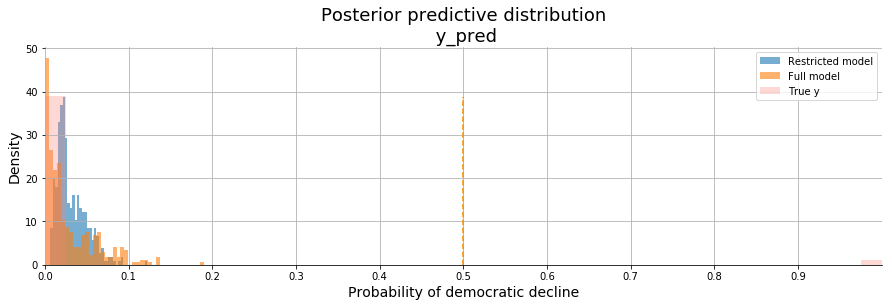

In [22]:
plt.figure(figsize=[15,4])

hist_nums1 = plt.hist(y_pred_prob1, bins=40, alpha = 0.6, density= True, label = "Restricted model")
hist_nums10 = plt.hist(y_pred_prob10, bins=40, alpha = 0.6, density= True, label = "Full model")

plt.hist(y_test, bins=40, alpha = 0.3, density= True, label = "True y", color = "salmon")


plt.vlines(0.5,0,max(hist_nums1[0]), colors= "darkorange", linestyles= "dashed")

plt.ylabel("Density", fontsize = 14)
plt.xlabel("Probability of democratic decline", fontsize = 14)
plt.title("Posterior predictive distribution\n y_pred", fontsize=18)

plt.xlim(0,1)
plt.xticks(np.arange(0,1,0.1))

plt.legend()
plt.grid()
sns.despine(left = True)
plt.show()

---
Here the difference between the full and restricted model shows the same pattern. The full model is more inclined to distribute "extreme" values (0 and above 0.1).
As mentioned in the introduction, the reader should note that there are very few declines in the test data (y=1: n=10).

---

In [23]:
# number of events in the three test years.
sum(y_test)

10

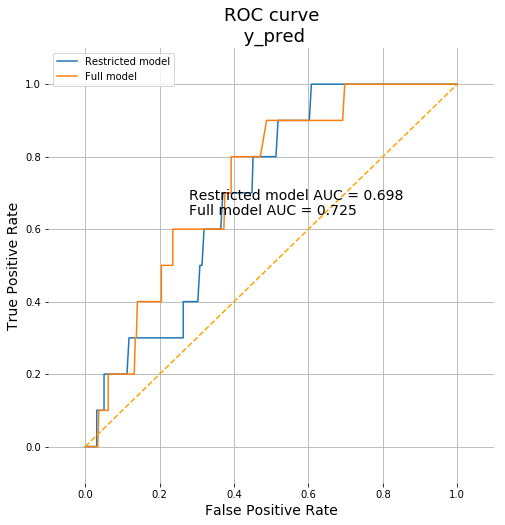

In [24]:
# but this is in sample! You need out of sample... 2010 would be best...
fpr1, tpr1, thresholds1 = roc_curve(y_test, y_pred_prob1)
auc1 = round(roc_auc_score(y_test, y_pred_prob1), 3)

fpr10, tpr10, thresholds10 = roc_curve(y_test, y_pred_prob10)
auc10 = round(roc_auc_score(y_test, y_pred_prob10), 3)

plt.figure(figsize=[8,8])

plt.plot(fpr1, tpr1, label = "Restricted model")
plt.plot(fpr10, tpr10, label = "Full model")

plt.plot(np.arange(0, 1.1, 0.1), np.arange(0, 1.1, 0.1), linestyle = "dashed", color = "orange")

plt.text(0.28,0.68,"Restricted model AUC = " + str(auc1), fontsize = 14)
plt.text(0.28,0.64,"Full model AUC = " + str(auc10), fontsize = 14)


plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
plt.title('ROC curve\n y_pred', fontsize = 18)
plt.xlabel('False Positive Rate', fontsize = 14)
plt.ylabel('True Positive Rate', fontsize = 14)
plt.grid(True)

plt.legend()
sns.despine(left=True, bottom= True)
plt.show()

As was the case in the PSIS-loo estimation the difference is not overwhelming. That being said, both models does OK given the subject at hand. This is a bit surprising given the simpicity of the models.

---
# Discussion of problems, and potential improvements

**Regarding the coefficients**
As stated in the beginning of the report, this was not a thorough attempt to predict democratic decline - this would have involved more features and a more elaborate model.  
Instead the point was to explore two sets of predictors in a hierarchical setting; the features regarding modernization and the features regarding current regime. 

Concerning the modernization features both log(GDP per capita) and log(infant mortality) seemed to have a part to play, However an interaction-term between the two did not bring anything new to the table, and could readily be omitted. It should be noted that these features brought very little new information compared to the base model. This is not to say that the features are not relevant, it is just to say that much of the variation they accounted for was already captured by the heirarchical structure. However, as one of the points of this structure is to capture variance of omitted variables it is only natural that when these variables are included the structure become less important. It is thus desirable to identify more substantially interesting variables which can account for the variation in th structure; just as we did here.

Concerning the current-regime-features Democ and Autoc; both of these features along with their interaction-term contributes to the prediction. As opposed to the features concerning modernization, these features did seem to bring new information to the model not already contained in the structure. The fact that both high Democ and high Autoc were associated with a lower probability of democratic decline augments my assessment that using these two un-aggregated measures is the way to go about it. 

**Regarding the model**
Other then bringing in more relevant features, and maybe add a design suited for causal inference, there are a number of augmentation/modifications I would like to implement in future models:

- Gaussian processes
    - As mentioned in the beginning nested year-intercept I used to predict y_pred was just the all time average. One could also choose to utilize only information from years closer to the test-set. A more systematic approach however would be to implement a Gaussian process over all train-set years to predict both the a $\mu$ and a $\sigma$ for priors to use on the year in the test-set. 
    
    - A more advanced edeavour would be to augment the data with geospatial information and make countries influence each other according to proximity. The old-school way of approximating is simply to include "regions" or "continent" in the model. However geospatial data and a Gaussian process might do much better and get us closer to what we are actually modeling.


- Varying slopes
    - The hierarchical structure I implemented allowed each year and each country to have an intercept varying from the others. There are no other reason than the computational limitation of my computer, that I did not also let the slopes vary from some shared mu_beta_i.


- Poisson/Negative binomial/ordered categorical/multinomial model
    - As mentioned in the introduction the operationalization of the y in entail a lot of information reduction - or should I say information gluttony. Of course there is a big difference between declining 1 point and declining 9 on a 21-points scale. I tried, but failed, in implementing a more appropriate model such as count (Poisson or negative binomial) or a model with multiple categorical outcomes. The problem I encountered with the count model was that they do not accept any upper limit. Due to the construction of the polity2 index a country cannot decline more then 21 points. That would mean going from top to bottom. The posterior predictive distributions I got from my count models predicted some declines far greater than this. 
    The problem I encountered whit ordered categorical was that some of the events now became extremely rare, which does challenge the model futher. 
    I do, however, believe that these problems can be overcome in time and as my familiarity with these models increase.   


- Zero inflated, hurdle model or survival
    - All three options which might in future work help me to manage the problem of the count and categorical models just discussed.


**This concludes the report**.

---

# Litterature:

[Boix, 2011] Boix, C. (2011). Democracy, Development, and the International
System. American Political Science Review, 105(04):809–828.

[Goldstone, 2001] Goldstone, J. A. (2001). Toward a Fourth Generation of Rev-
olutionary Theory. Annual Review of Political Science, 4:139–87.

[PITF 2010] Goldstone, Jack A., Robert H. Bates, David L. Epstein, Ted Robert Gurr, Micheal B. Lustik, Monty G.
Marshall, Jay Ulfelder, and Mark Woodward. 2010. “A Model for Forecasting Political
Inastability.” American Journal of Political Science 54 (1): 190–208.

[King & Zeng 2001]King, G., & Zeng, L. (2001). Logistic Regression in Rare Events Data. Political Analysis, 9(2), 137-163. doi:10.1093/oxfordjournals.pan.a004868

[Lipset, 1959] Lipset, S. M. (1959). Some Social Requisites of Democracy: Eco-
nomic Development and Political Legitimacy. American Political Science
Review, 53(01):69–105.

[Marshall et al. 2016] Monty G. Marshall, Ted Robert Gurr, Keith Jaggers, POLITY™ IV PROJECT
Political Regime Characteristics and Transitions, 1800-2016 Dataset Users’ Manual
Center for Systemic Peace www.systemicpeace.org

[Przeworski and Limongi, 1997] Przeworski, A. and Limongi, F. (1997). Mod-
ernization: Theories and Facts. World Politics, 49(2):155–183.


[Robinson, 2006] Robinson, J. A. (2006). ECONOMIC DEVELOPMENT AND
DEMOCRACY. Annual Review of Political Science, 9(1):503–527.

# Data:
http://www.systemicpeace.org/

https://www.gapminder.org/data/

http://databank.worldbank.org/data/

## Appendix
**N_eff & R_hat check**
Below is the stan-summary for all nine models, so that one can asses the convegens diagnostics. Note however - as siad earlier - that these are vary long list, not only due to the country and year specific intercepts, but espeacily due to the fact the for each observation I have estimatet the log_lik and the y_tilde.


In [25]:
print(stan_model1)

Inference for Stan model: anon_model_b6add9c4925483ed7b950ed90ebf6cc1.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

                  mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
alpha_raw1[0]     -4.6    0.14   8.63 -23.08 -10.38  -4.47    1.5  11.38   4000    1.0
alpha_raw1[1]    -1.88    0.12   7.54 -17.63  -6.98  -1.41   3.49  11.71   4000    1.0
alpha_raw1[2]     2.83    0.12   7.32 -12.04  -1.96   3.01   8.01  16.45   4000    1.0
alpha_raw1[3]    -3.74    0.14   8.81 -21.87  -9.39  -3.57   2.28  12.75   4000    1.0
alpha_raw1[4]     6.58    0.09   5.44  -4.81   3.05   6.84  10.35  16.51   4000    1.0
alpha_raw1[5]     8.52    0.12   7.87   -6.9   3.25   8.73  13.98  22.94   4000    1.0
alpha_raw1[6]    -10.7    0.12   7.67 -26.21 -15.87 -10.26  -5.41   3.54   4000    1.0
alpha_raw1[7]    -7.88    0.11    6.8 -22.54  -12.3  -7.58  -3.02   4.47   4000    1.0
alpha_raw1[8]    13.57    0.

In [26]:
print(stan_model2)

Inference for Stan model: anon_model_573806d0a5e33bb77dc1ecd86a680f4e.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

                  mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
beta[0]          -0.52  2.0e-3    0.1  -0.71  -0.58  -0.52  -0.45  -0.33   2259    1.0
alpha_raw1[0]    -6.49    0.13   8.24 -23.24 -11.92  -6.35  -0.76   8.99   4000    1.0
alpha_raw1[1]    -2.02    0.12   7.74 -17.93   -7.2  -1.75   3.29  12.13   4000    1.0
alpha_raw1[2]     3.18    0.12   7.66 -12.33  -1.87   3.35   8.61  17.37   4000    1.0
alpha_raw1[3]    -5.02    0.14   9.02  -23.4 -11.01  -4.84   1.29  11.83   4000    1.0
alpha_raw1[4]    10.51     0.1   6.54  -3.48   6.31  10.88  14.94  22.61   4000    1.0
alpha_raw1[5]     9.41    0.14   8.86  -8.61   3.51   9.54  15.55  26.14   4000    1.0
alpha_raw1[6]    -7.27    0.13    8.2 -23.29 -12.73  -7.16  -1.74   8.21   4000    1.0
alpha_raw1[7]    -5.87    0.

In [27]:
print(stan_model3)

Inference for Stan model: anon_model_573806d0a5e33bb77dc1ecd86a680f4e.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

                  mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
beta[0]           0.48  2.1e-3    0.1   0.29   0.41   0.48   0.55   0.67   2276    1.0
alpha_raw1[0]    -6.21    0.14   8.65 -24.09 -11.85   -6.0  -0.27  10.05   4000    1.0
alpha_raw1[1]    -1.52    0.13   8.04 -18.21  -6.65   -1.2   3.94  13.37   4000    1.0
alpha_raw1[2]     2.32    0.11   7.01 -12.44  -2.22   2.58   7.25  15.19   4000    1.0
alpha_raw1[3]     -4.9    0.14   8.79  -22.9 -10.51  -4.64   0.95  12.07   4000    1.0
alpha_raw1[4]     6.74    0.09   5.79  -5.44   3.05   6.95  10.68  17.66   4000    1.0
alpha_raw1[5]     9.72    0.13   8.44  -7.29   4.07   9.76  15.68  25.26   4000    1.0
alpha_raw1[6]    -8.38    0.13   8.05  -24.8 -13.53  -8.19  -2.85   6.79   4000    1.0
alpha_raw1[7]    -8.84    0.

In [28]:
print(stan_model4)

Inference for Stan model: anon_model_573806d0a5e33bb77dc1ecd86a680f4e.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

                  mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
beta[0]           0.22  3.0e-3   0.14  -0.07   0.12   0.21   0.31    0.5   2231    1.0
beta[1]          -0.36  3.3e-3   0.14  -0.64  -0.46  -0.37  -0.27  -0.09   1871    1.0
alpha_raw1[0]    -6.75    0.13   8.52 -23.77 -12.38  -6.57  -0.73   9.46   4000    1.0
alpha_raw1[1]    -1.53    0.12   7.75 -17.06  -6.88  -1.17    3.8  13.08   4000    1.0
alpha_raw1[2]     2.75    0.12   7.68  -13.0   -2.2   2.96   8.09  17.23   4000    1.0
alpha_raw1[3]    -5.05    0.13   8.51 -22.08 -10.87  -4.89   0.94  10.96   4000    1.0
alpha_raw1[4]     9.53    0.09   5.95  -2.46   5.64   9.79  13.57  20.68   4000    1.0
alpha_raw1[5]     9.46    0.14   8.95  -9.17   3.68   9.56  15.27  26.42   4000    1.0
alpha_raw1[6]    -7.37    0.

In [29]:
print(stan_model5)

Inference for Stan model: anon_model_573806d0a5e33bb77dc1ecd86a680f4e.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

                  mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
beta[0]           -0.2    0.02   0.63  -1.51  -0.62  -0.19   0.23   1.03   1193    1.0
beta[1]          -0.57  9.9e-3   0.34  -1.26  -0.79  -0.57  -0.34   0.09   1200    1.0
beta[2]           0.05  2.2e-3   0.08   -0.1 1.2e-4   0.05    0.1   0.21   1182    1.0
alpha_raw1[0]    -6.43    0.13    8.4 -23.59 -11.91  -6.14  -0.76   9.42   4000    1.0
alpha_raw1[1]    -1.91    0.12   7.84 -18.04  -7.14  -1.64   3.35  13.17   4000    1.0
alpha_raw1[2]     2.45    0.12   7.59 -13.21  -2.51   2.76   7.77   16.5   4000    1.0
alpha_raw1[3]    -4.85    0.13   8.51  -22.2 -10.42  -4.71   0.92  11.41   4000    1.0
alpha_raw1[4]     9.23     0.1   6.28  -3.86    5.3    9.4  13.42  20.96   4000    1.0
alpha_raw1[5]     9.36    0.

In [30]:
print(stan_model6)

Inference for Stan model: anon_model_573806d0a5e33bb77dc1ecd86a680f4e.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

                  mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
beta[0]           0.39    0.02   0.68  -0.96  -0.07    0.4   0.85   1.72   1384    1.0
beta[1]           -0.3  9.8e-3   0.36  -1.01  -0.55  -0.31  -0.05   0.42   1364    1.0
beta[2]         4.2e-3  2.1e-3   0.08  -0.15  -0.05 4.3e-3   0.06   0.16   1508    1.0
beta[3]           -0.2  8.6e-4   0.05  -0.29  -0.23   -0.2  -0.17  -0.11   2976    1.0
beta[4]          -0.44  1.0e-3   0.05  -0.54  -0.47  -0.43   -0.4  -0.33   2788    1.0
alpha_raw1[0]    -4.02    0.14   8.88 -21.69  -9.96  -3.65   1.99  12.85   4000    1.0
alpha_raw1[1]     1.27    0.13   8.05 -15.79  -3.99    1.5   6.97  15.88   4000    1.0
alpha_raw1[2]     5.99    0.12   7.65  -9.78   1.15   6.33   11.4  19.89   4000    1.0
alpha_raw1[3]    -4.56    0.

In [31]:
print(stan_model7)

Inference for Stan model: anon_model_573806d0a5e33bb77dc1ecd86a680f4e.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

                  mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
beta[0]          -0.31  8.3e-4   0.04   -0.4  -0.34  -0.31  -0.28  -0.22   2836    1.0
beta[1]           -0.5  9.8e-4   0.05  -0.61  -0.54   -0.5  -0.46  -0.39   3050    1.0
alpha_raw1[0]    -2.66    0.15   9.41 -21.62  -8.82  -2.48   3.94  15.04   4000    1.0
alpha_raw1[1]     0.32    0.12   7.83 -15.71  -4.75   0.67   5.72  14.81   4000    1.0
alpha_raw1[2]     4.11    0.12   7.55 -11.42   -0.7   4.39   9.26  18.25   4000    1.0
alpha_raw1[3]    -3.13    0.14   8.93 -20.96  -9.25  -3.02   3.12  13.52   4000    1.0
alpha_raw1[4]     5.38    0.09   5.75  -6.58   1.71   5.68   9.31  15.93   4000    1.0
alpha_raw1[5]      5.7    0.12   7.69  -9.92   0.71    6.1   10.8  20.05   4000    1.0
alpha_raw1[6]    -9.51    0.

In [32]:
print(stan_model8)

Inference for Stan model: anon_model_573806d0a5e33bb77dc1ecd86a680f4e.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

                  mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
beta[0]          -0.38  1.1e-3   0.05  -0.47  -0.41  -0.38  -0.34  -0.28   1995    1.0
beta[1]          -0.57  1.2e-3   0.06  -0.69  -0.61  -0.57  -0.53  -0.46   2141    1.0
beta[2]           0.08  2.7e-4   0.02   0.05   0.07   0.08    0.1   0.12   4000    1.0
alpha_raw1[0]    -2.14    0.14   8.95 -20.15  -8.01  -2.05   3.78  15.17   4000    1.0
alpha_raw1[1]    -0.36    0.13   8.01 -16.63  -5.58   0.05   5.13  14.95   4000    1.0
alpha_raw1[2]      4.1    0.12   7.53 -11.55   -0.8   4.51   9.32  17.89   4000    1.0
alpha_raw1[3]    -3.69    0.14   8.78 -21.96  -9.44  -3.62   2.17  13.73   4000    1.0
alpha_raw1[4]     3.47    0.09   5.51  -8.06   0.01   3.64   7.08   13.9   4000    1.0
alpha_raw1[5]     5.63    0.

In [33]:
print(stan_model9)

Inference for Stan model: anon_model_573806d0a5e33bb77dc1ecd86a680f4e.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

                  mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
beta[0]            0.4    0.02   0.68  -0.95  -0.05   0.41   0.87   1.71   1020    1.0
beta[1]          -0.27    0.01   0.36  -0.98  -0.51  -0.26  -0.02   0.42   1042    1.0
beta[2]        -9.3e-3  2.4e-3   0.08  -0.16  -0.07-9.9e-3   0.04   0.15   1163    1.0
beta[3]          -0.27  1.1e-3   0.05  -0.37  -0.31  -0.27  -0.24  -0.17   2439    1.0
beta[4]          -0.51  1.2e-3   0.06  -0.63  -0.55  -0.51  -0.47  -0.39   2348    1.0
beta[5]           0.07  2.7e-4   0.02   0.03   0.06   0.07   0.08    0.1   4000    1.0
alpha_raw1[0]    -3.43    0.14    8.7 -21.01   -9.3   -3.4   2.69  13.03   4000    1.0
alpha_raw1[1]     0.58    0.13   8.04 -15.87  -4.89   1.05   6.27  15.84   4000    1.0
alpha_raw1[2]     5.71    0.

In [34]:
print(stan_model10)

Inference for Stan model: anon_model_573806d0a5e33bb77dc1ecd86a680f4e.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

                  mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
beta[0]           0.32  4.1e-3   0.16 4.9e-3   0.21   0.32   0.43   0.65   1592    1.0
beta[1]          -0.31  3.9e-3   0.16  -0.61  -0.42  -0.31  -0.21 7.6e-3   1618    1.0
beta[2]          -0.27  1.2e-3   0.05  -0.37   -0.3  -0.27  -0.24  -0.17   1925    1.0
beta[3]           -0.5  1.3e-3   0.06  -0.62  -0.54   -0.5  -0.46  -0.39   2143    1.0
beta[4]           0.07  2.7e-4   0.02   0.03   0.06   0.07   0.08    0.1   4000    1.0
alpha_raw1[0]    -3.56    0.14   9.01 -21.27   -9.5  -3.48   2.83  13.39   4000    1.0
alpha_raw1[1]     0.34    0.13   8.06 -15.97  -5.02   0.54   6.07  15.37   4000    1.0
alpha_raw1[2]     5.67    0.12   7.72 -10.63   0.68   5.92  11.01  19.87   4000    1.0
alpha_raw1[3]    -4.76    0.